<a href="https://colab.research.google.com/github/Hion-cy/ClassFiles/blob/main/Practica_18_AL263158.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Práctica #18: Ejercicios con EDA 1

* **Matricula** AL263158
* Programación para analítica descriptiva y predictiva

**Instrucciones para los estudiantes:**

1. Descargar el archivo AirQuality.csv desde el enlace proporcionado.
2. Realizar un EDA completo, incluyendo:
- Descripción de los datos (medias, medianas, desviaciones estándar, etc.).
- Histogramas para las columnas numéricas.
- Gráficas de barras para las columnas categóricas (por ejemplo, DayOfWeek).
- Boxplots para identificar outliers en las columnas numéricas.
- Matriz de correlación y mapa de calor.
- Pairplot para visualizar relaciones entre variables numéricas.
- Pruebas de normalidad (Shapiro-Wilk, Anderson-Darling, Kolmogorov-Smirnov) y QQplot para las columnas numéricas.
3. Identificar y tratar los datos faltantes utilizando técnicas como imputación por media, mediana o moda, o eliminación de filas/columnas según sea apropiado.
4. Repetir el EDA después del tratamiento de datos faltantes y comparar los resultados.

In [100]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from google.colab import drive
#drive.mount('/content/drive')

df=pd.read_csv('/content/drive/MyDrive/ClassFiles/AirQuality.csv')

print("Dimensiones:", df.shape)
print("CSV Original")
print(df.head())

##EL delimitador del CSV es incorrecto
print("\nCSV con delimitador \";\"")
#delimitador corregido
df_or=pd.read_csv('/content/drive/MyDrive/ClassFiles/AirQuality.csv', delimiter=";")
print(df_or.head())

conteo_v=df_or.count()
print("\nConteo de valores")
print(conteo_v)
#Existen 2 columnas con 0 datos que seran eliminadas
df_or=df_or.iloc[:, :-2]

print("\nDataFrame después de eliminar las últimas dos columnas")
print(df_or.head())


print("\nTipos de datos")
print(df_or.dtypes)

print("Cambio de tipos de datos")
#Datos categoricos, de acuerdo a las instrucciones Date (Dayoftheweek no existe en el dataset)
df_or['Time'] = df_or['Time'].astype('category')
df_or['Date'] = df_or['Date'].astype('category')

df_or['CO(GT)'] = pd.to_numeric(df_or['CO(GT)'].str.replace (',','.'), errors='coerce')
df_or['C6H6(GT)'] = pd.to_numeric(df_or['C6H6(GT)'].str.replace (',','.'), errors='coerce')
df_or['T'] = pd.to_numeric(df_or['T'].str.replace (',','.'), errors='coerce')
df_or['RH'] = pd.to_numeric(df_or['RH'].str.replace (',','.'), errors='coerce')
df_or['AH'] = pd.to_numeric(df_or['AH'].str.replace (',','.'), errors='coerce')

print("\nTipos de datos después de cambios")
print(df_or.dtypes)

#valores unicos
print("\nValores únicos")
print(df_or.nunique())

#valores duplicados
print("\nValores duplicados")
print(df_or.duplicated().sum())

print("\nValores duplicados")
print(df_or[df_or.duplicated()])

print("\nValores nulos")
print(df_or.isnull().sum())

Dimensiones: (9471, 1)
CSV Original
                                                                                                            Date;Time;CO(GT);PT08.S1(CO);NMHC(GT);C6H6(GT);PT08.S2(NMHC);NOx(GT);PT08.S3(NOx);NO2(GT);PT08.S4(NO2);PT08.S5(O3);T;RH;AH;;
10/03/2004;18.00.00;2            6;1360;150;11                 9;1046;166;1056;113;1692;1268;13 6;48 9;0                                                7578;;                                                                          
10/03/2004;19.00.00;2;1292;112;9 4;955;103;1174;92;1559;972;13 3;47                             7;0  7255;;                                                NaN                                                                          
10/03/2004;20.00.00;2            2;1402;88;9                   0;939;131;1140;114;1555;1074;11  9;54 0;0                                                7502;;                                                                          
10/03/2004;21.00.00;2           

###EDA antes de la limpieza de datos



Graficas de variables categoricas y numericas


Descripcion de los datos originales
            CO(GT)  PT08.S1(CO)     NMHC(GT)     C6H6(GT)  PT08.S2(NMHC)  \
count  9357.000000  9357.000000  9357.000000  9357.000000    9357.000000   
mean    -34.207524  1048.990061  -159.090093     1.865683     894.595276   
std      77.657170   329.832710   139.789093    41.380206     342.333252   
min    -200.000000  -200.000000  -200.000000  -200.000000    -200.000000   
25%       0.600000   921.000000  -200.000000     4.000000     711.000000   
50%       1.500000  1053.000000  -200.000000     7.900000     895.000000   
75%       2.600000  1221.000000  -200.000000    13.600000    1105.000000   
max      11.900000  2040.000000  1189.000000    63.700000    2214.000000   

           NOx(GT)  PT08.S3(NOx)      NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)  \
count  9357.000000   9357.000000  9357.000000   9357.000000  9357.000000   
mean    168.616971    794.990168    58.148873   1391.479641   975.072032   
std     257.433866    321.993552   126.940455    4

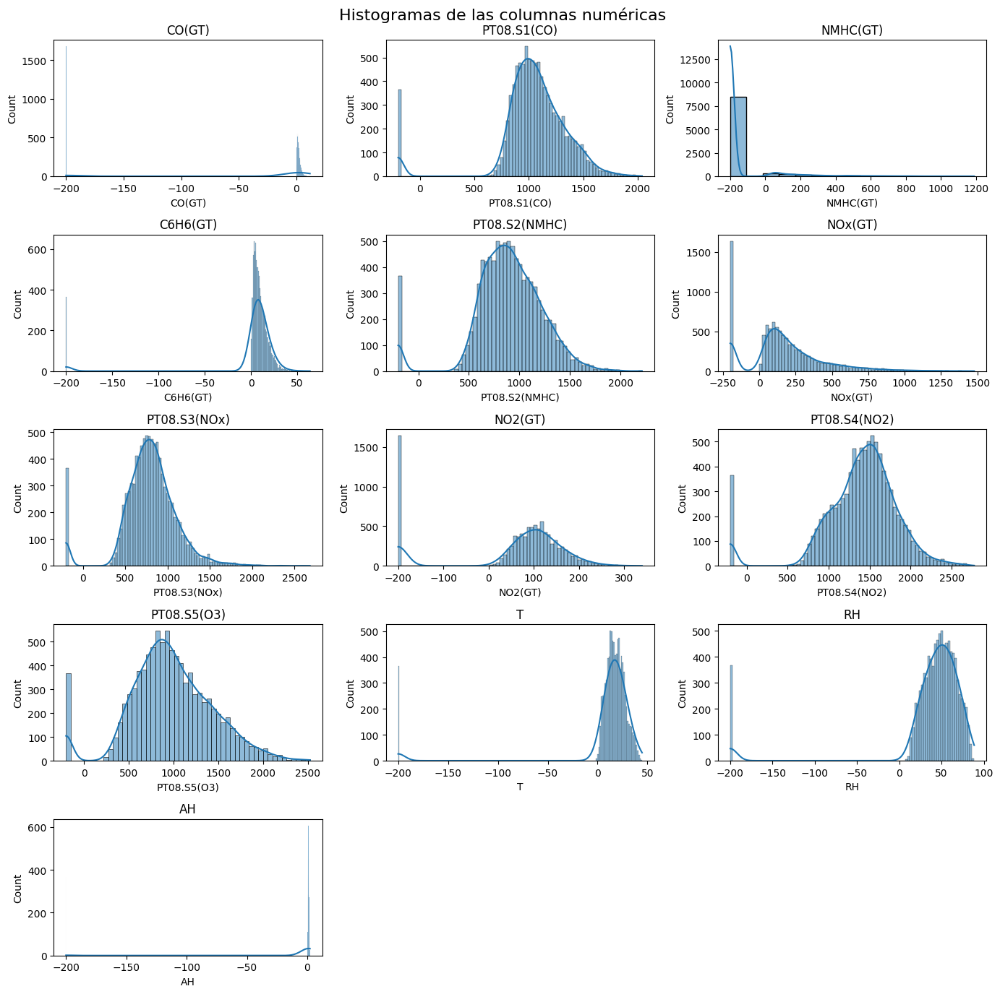


Gráficas de barras para las columnas categóricas


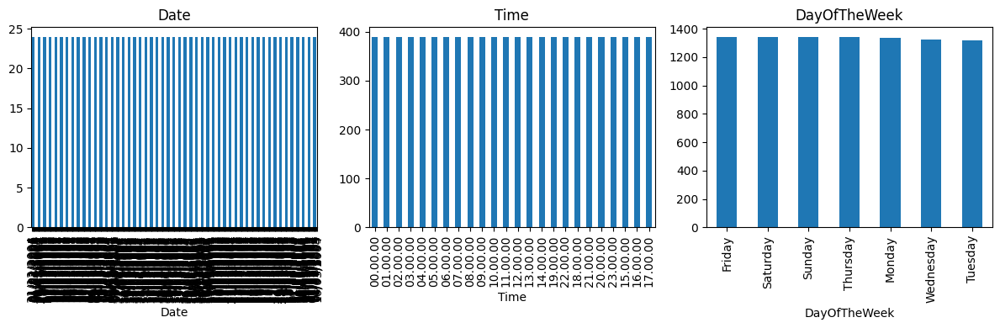

In [122]:
#Descripción de los datos (medias, medianas, desviaciones estándar, etc.).
print("\nDescripcion de los datos originales")
print(df_or.describe())

#Histogramas para las columnas numéricas.
plt.figure(figsize=(14, 14))
plt.suptitle('Histogramas de las columnas numéricas', fontsize=16)
columnas_numericas = df_or.select_dtypes(include=[np.number]).columns
for i, col in enumerate(columnas_numericas):
    plt.subplot(5, 3, i + 1)
    sns.histplot(df_or[col], kde=True)
    plt.title(col)
plt.tight_layout()
plt.show()

#Gráficas de barras para las columnas categóricas (por ejemplo, Date).
print("\nGráficas de barras para las columnas categóricas")
columnas_categoricas = df_or.select_dtypes(include=['category']).columns
columnas_categoricas = [col for col in columnas_categoricas]
plt.figure(figsize=(12, 4))
for i, col in enumerate(columnas_categoricas):
    plt.subplot(1, len(columnas_categoricas), i + 1)
    df_or[col].value_counts().plot(kind='bar')
    plt.title(col)
plt.tight_layout()
plt.show()




**Nota:** Como se puede observar las graficas cuentan con cientos de registros que se repiten y no ofrecen una vision clara sobre el panorama de los datos. Por lo que con respecto a la fecha se decidio agregar una columna para considerar el dia de la semana "DayOfTheWeek" (Como mencionaba la instruccion original) y ver si ofrece una mejor visualizacion de la situacion.


DataFrame con columna DayOfTheWeek
         Date      Time  CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  \
0  10/03/2004  18.00.00     2.6       1360.0     150.0      11.9   
1  10/03/2004  19.00.00     2.0       1292.0     112.0       9.4   
2  10/03/2004  20.00.00     2.2       1402.0      88.0       9.0   
3  10/03/2004  21.00.00     2.2       1376.0      80.0       9.2   
4  10/03/2004  22.00.00     1.6       1272.0      51.0       6.5   

   PT08.S2(NMHC)  NOx(GT)  PT08.S3(NOx)  NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)  \
0         1046.0    166.0        1056.0    113.0        1692.0       1268.0   
1          955.0    103.0        1174.0     92.0        1559.0        972.0   
2          939.0    131.0        1140.0    114.0        1555.0       1074.0   
3          948.0    172.0        1092.0    122.0        1584.0       1203.0   
4          836.0    131.0        1205.0    116.0        1490.0       1110.0   

      T    RH      AH DayOfTheWeek  
0  13.6  48.9  0.7578    Wednesday  
1  13.

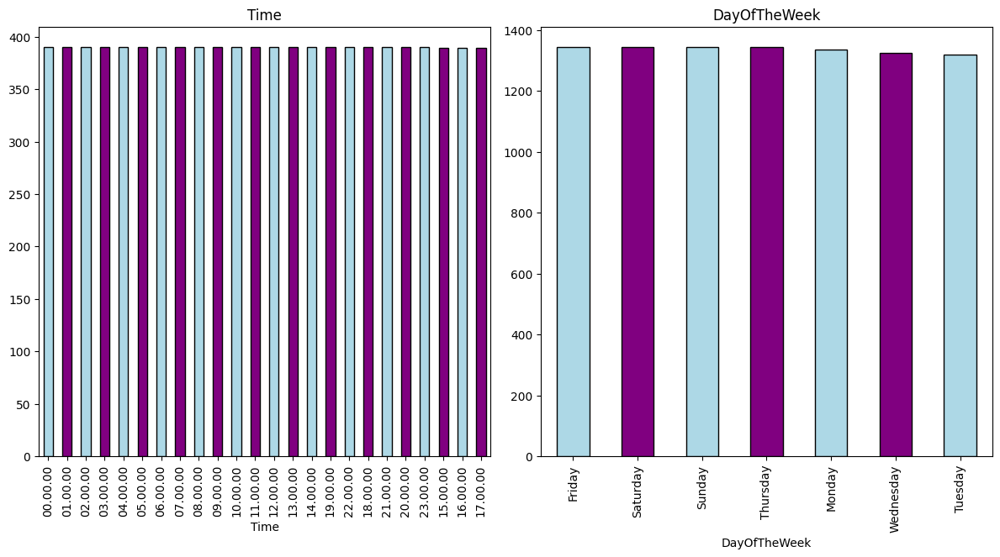

In [102]:
#Agregar columna del dia de la semana
df_or['DayOfTheWeek'] = pd.to_datetime(df_or['Date'], format='%d/%m/%Y', errors='coerce').dt.day_name()
print("\nDataFrame con columna DayOfTheWeek")
df_or['DayOfTheWeek']=df_or['DayOfTheWeek'].astype('category')

print(df_or.head())

#Graficas de variables categoricas reemplazando Date con DayOfTheWeek
print("\nGráficas de barras para las columnas categóricas")
columnas_categoricas = df_or.select_dtypes(include=['category']).columns
columnas_categoricas = [col for col in columnas_categoricas if col != 'Date']
plt.figure(figsize=(12, 12))
for i, col in enumerate(columnas_categoricas):
    plt.subplot(2, len(columnas_categoricas), i + 1)
    df_or[col].value_counts().plot(kind='bar', color=['lightblue','purple'], edgecolor='black')
    plt.title(col)
plt.tight_layout()
plt.show()


Boxplots para identificar outliers en las columnas numéricas.

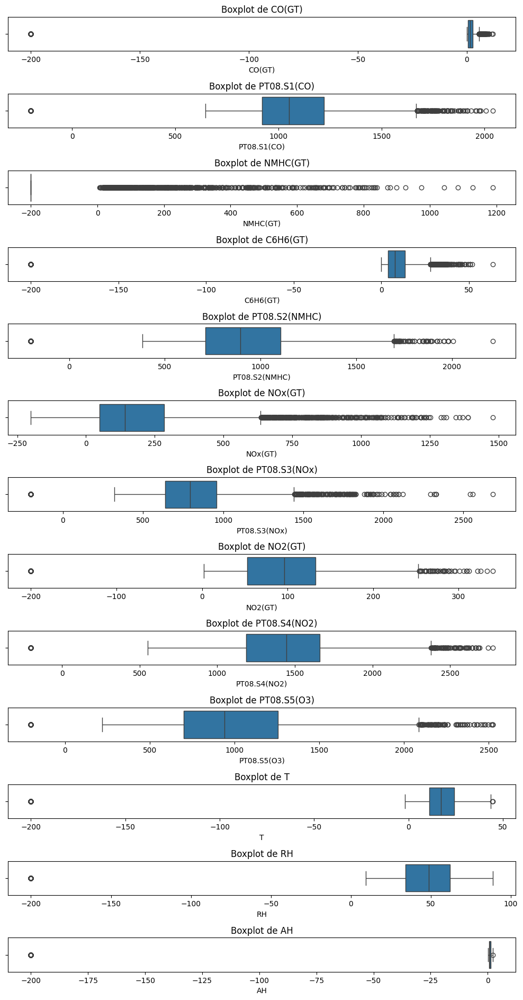

In [103]:
numeric_columns = df_or.select_dtypes(include=[np.number]).columns

# Configurar el tamaño de la figura
plt.figure(figsize=(10, 20))

# Crear boxplots para each columna numérica
for i, col in enumerate(numeric_columns, 1):
    plt.subplot(14, 1, i)
    sns.boxplot(x=df_or[col]) # Changed df to df_or
    plt.title(f'Boxplot de {col}')
plt.tight_layout()
plt.show()

-CO GT, c6h6, no es posible que sea -200 lo que indicaria una falla en el sensor
-Nox GT se extiende demasiado hacia los valores positivos (aprox 1500) lo que indicaria que el sensor tuvo multiples fallos
PT08 se extiende demasiado
Variables T, rh y ah arrojan valores negativos que posiblemente son fallos

Matriz de correlacion y mapa de calor

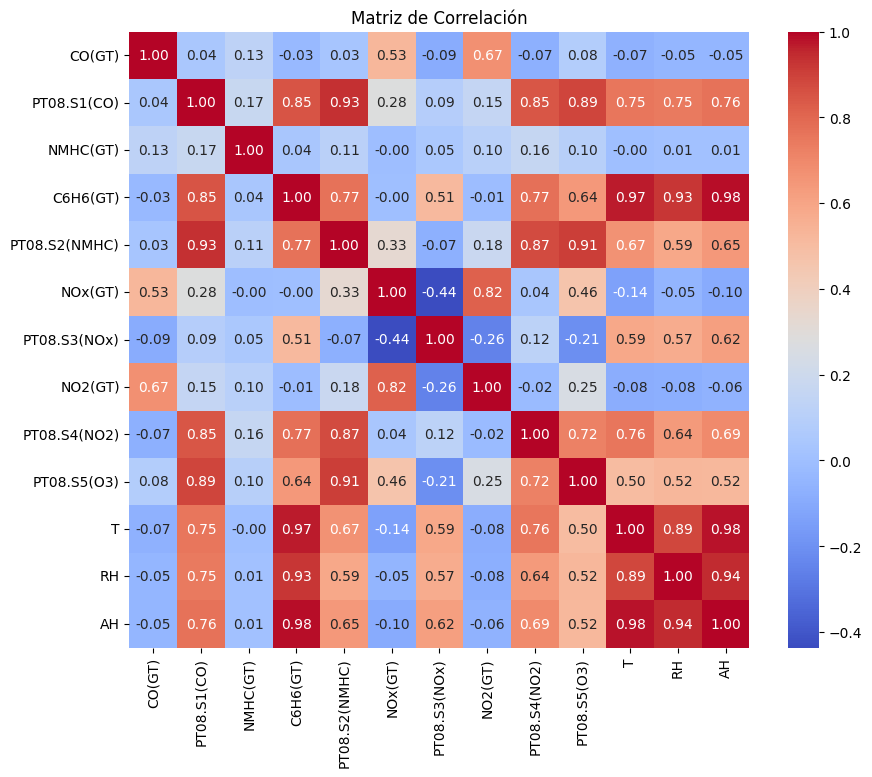

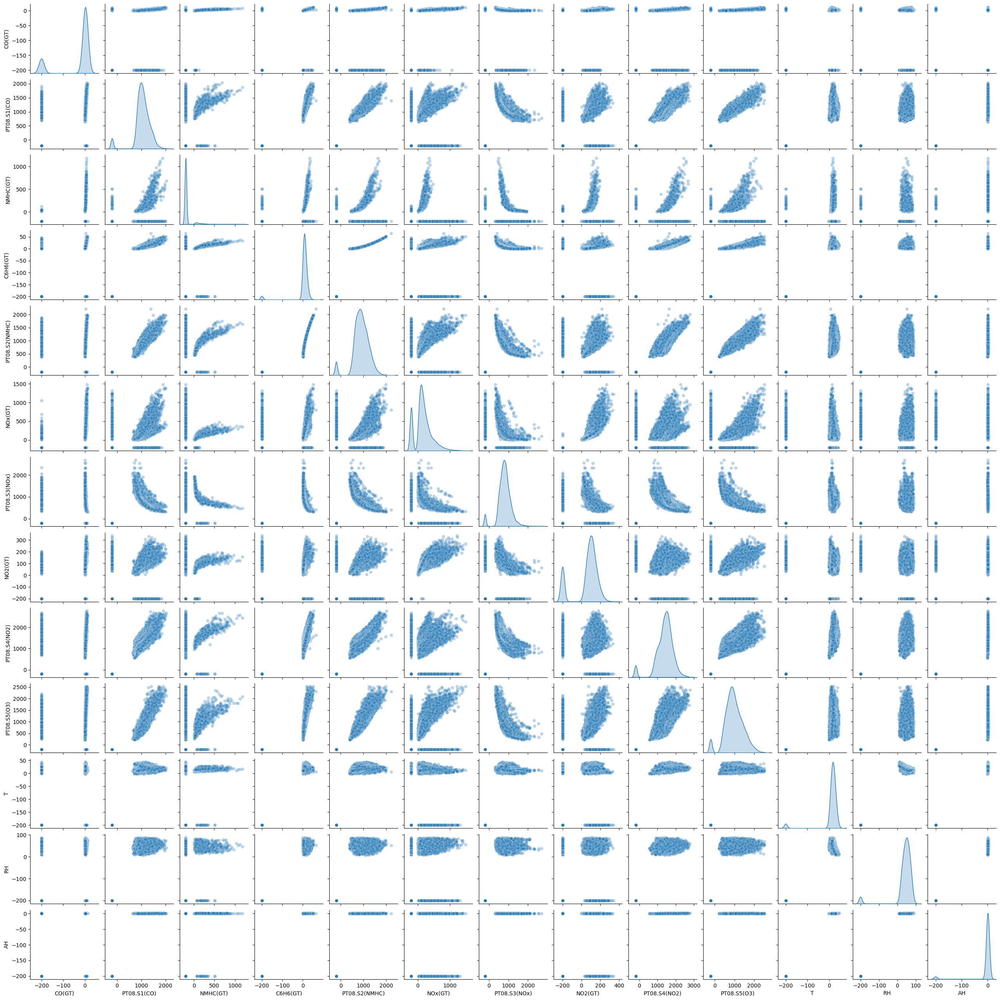

In [104]:
#matriz de correlacion
numeric_df = df_or.select_dtypes(include=[np.number]) # Select only numeric columns
corr_matrix = numeric_df.corr() # Calculate correlation matrix on numeric columns

#mapa de calor
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f") # Add heatmap
plt.title('Matriz de Correlación')
plt.show()

#pairplot
sns.pairplot(numeric_df, plot_kws={'alpha': 0.3}, diag_kind='kde', height=2) # Use numeric_df directly
plt.show()

### Pruebas de normalidad

In [105]:
print("Valores nulos que pueden afectar las pruebas")
print(df_or.isnull().sum())
print("Se eliminan los valores nulos para poder realizar las pruebas de normalidad")
df_or=df_or.dropna()

Valores nulos que pueden afectar las pruebas
Date             114
Time             114
CO(GT)           114
PT08.S1(CO)      114
NMHC(GT)         114
C6H6(GT)         114
PT08.S2(NMHC)    114
NOx(GT)          114
PT08.S3(NOx)     114
NO2(GT)          114
PT08.S4(NO2)     114
PT08.S5(O3)      114
T                114
RH               114
AH               114
DayOfTheWeek     114
dtype: int64
Se eliminan los valores nulos para poder realizar las pruebas de normalidad


##Test Shapiro-Wilk

In [106]:
#normalidad para variables numericas
#Shapiro-wilk


print("\nPruebas de normalidad (Shapiro-Wilk)")

from scipy.stats import shapiro
numeric_columns = df_or.select_dtypes(include=[np.number]).columns
shapiro_results = []
for col in numeric_columns:
    statistic, pvalue = shapiro(df_or[col])
    shapiro_results.append({'Variable': col, 'Statistic': statistic, 'P-value': pvalue})
shapiro_df = pd.DataFrame(shapiro_results)
display(shapiro_df)


Pruebas de normalidad (Shapiro-Wilk)


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 9357.
  res = hypotest_fun_out(*samples, **kwds)


,Variable,Statistic,P-value
0,CO(GT),0.482373,1.029098e-96
1,PT08.S1(CO),0.823214,1.838410e-72
2,NMHC(GT),0.330694,4.807278e-103
3,C6H6(GT),0.339425,1.024033e-102
4,PT08.S2(NMHC),0.931101,3.970323e-54
5,NOx(GT),0.923689,5.538711e-56
6,PT08.S3(NOx),0.924983,1.137912e-55
7,NO2(GT),0.777417,2.316749e-77
8,PT08.S4(NO2),0.902383,1.378801e-60
9,PT08.S5(O3),0.979376,1.163713e-34


Los resultados nos muestran que todas las columnas cuentan con un valor menor del  0.05 que de acuerdo a las metricas del test de Shapiro indican que los resultados pueden no ser normales (Para ser normales deben ser mayores de 0.05). Mientras que el valor de statistic se encuentra cerca del 1 (resultados normales) para las columnas PT08 (S5, S2, S3 y S4), ademas de NOx(GT), lo que indica que los resultados puedes ser normales.
Por lo tanto debido que los valores de PValue son demasiado bajos, rechazamos la hipotesis de que los datos son normalizados.


datos


Test Anderson-Darling

In [107]:
#test anderson darlin
from scipy.stats import anderson
numeric_columns = df_or.select_dtypes(include=[np.number]).columns
anderson_results = []
for col in numeric_columns:
    result = anderson(df_or[col])
    anderson_results.append({'Variable': col, 'Statistic': result.statistic, 'Critical Values': result.critical_values})
anderson_df = pd.DataFrame(anderson_results)
display(anderson_df)

,Variable,Statistic,Critical Values
0,CO(GT),2501.153340,"[0.576, 0.656, 0.787, 0.918, 1.092]"
1,PT08.S1(CO),355.412461,"[0.576, 0.656, 0.787, 0.918, 1.092]"
2,NMHC(GT),2820.949168,"[0.576, 0.656, 0.787, 0.918, 1.092]"
3,C6H6(GT),2272.584842,"[0.576, 0.656, 0.787, 0.918, 1.092]"
4,PT08.S2(NMHC),119.208187,"[0.576, 0.656, 0.787, 0.918, 1.092]"
5,NOx(GT),188.794285,"[0.576, 0.656, 0.787, 0.918, 1.092]"
6,PT08.S3(NOx),159.031122,"[0.576, 0.656, 0.787, 0.918, 1.092]"
7,NO2(GT),894.661635,"[0.576, 0.656, 0.787, 0.918, 1.092]"
8,PT08.S4(NO2),183.341584,"[0.576, 0.656, 0.787, 0.918, 1.092]"
9,PT08.S5(O3),45.682343,"[0.576, 0.656, 0.787, 0.918, 1.092]"


De acuerdo con los resultados mostrados en la tabla todas las columnas son mayores al 5% considerado como el valor aceptable para ser considerados valores normales. POr lo tanto esta prueba tambien indica sesgos considerables

###Pruenba Kolmogorov-Smirnov

In [108]:
#Prueba Kolmogorov-Smirnov
from scipy.stats import kstest
kresult=[]
numeric_columns = df_or.select_dtypes(include=[np.number]).columns
for col in numeric_columns:
    stat = kstest(df_or[col], 'norm')
    kresult.append({'Variable': col, 'Statistic': stat.statistic, 'P-value': stat.pvalue, 'Sloc':stat.statistic_location, 'Sign': stat.statistic_sign})
kresult_df = pd.DataFrame(kresult)
display(kresult_df)

,Variable,Statistic,P-value,Sloc,Sign
0,CO(GT),0.496286,0.0,0.9000,-1
1,PT08.S1(CO),0.960885,0.0,647.0000,-1
2,NMHC(GT),0.902319,0.0,-200.0000,1
3,C6H6(GT),0.877966,0.0,2.0000,-1
4,PT08.S2(NMHC),0.960885,0.0,383.0000,-1
5,NOx(GT),0.824698,0.0,4.0000,-1
6,PT08.S3(NOx),0.960885,0.0,322.0000,-1
7,NO2(GT),0.824302,0.0,5.0000,-1
8,PT08.S4(NO2),0.960885,0.0,551.0000,-1
9,PT08.S5(O3),0.960885,0.0,221.0000,-1


Al igual que en los resultados anteriores, el hecho de que el dataset cuente con una gran cantidad de registros, los resultados afirman que existe una desviacion extremandamente significativa como lo muestra el hecho de que todos los pvalue son iguales a 0 (O redondeados a 0 ya que su valor es minusculo). Tomando en cuenta que para el valor de statistics (o valor D) entre mas cerca del 0 mas normal es el dato, la muestra nos indica que no hay ningun valor lo suficientemmente cerca del 0 para considerarse normal.

###QQplot

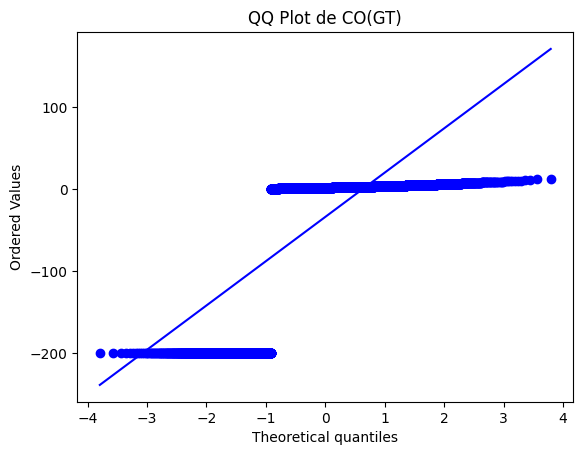

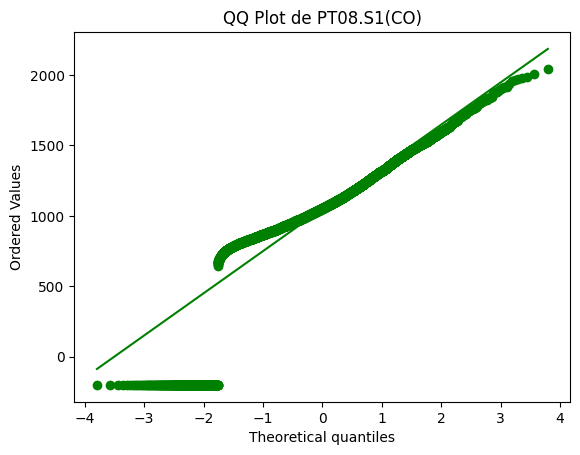

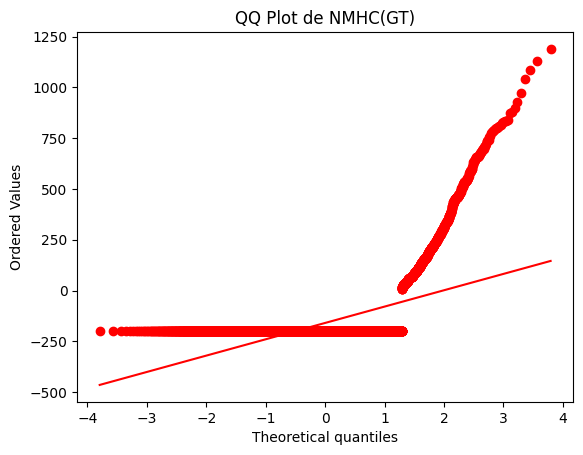

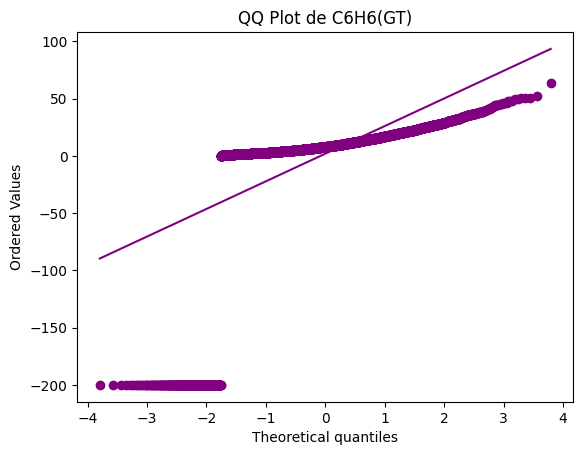

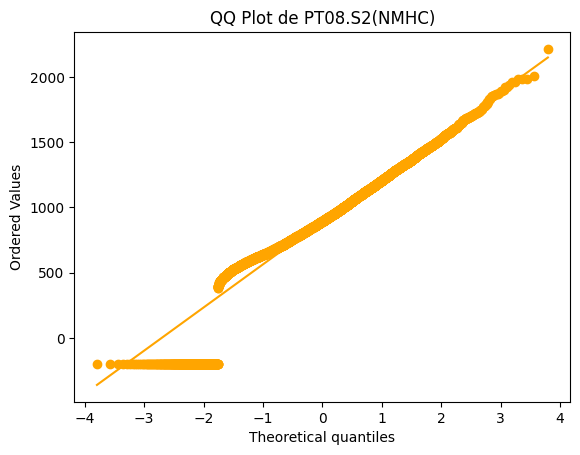

...

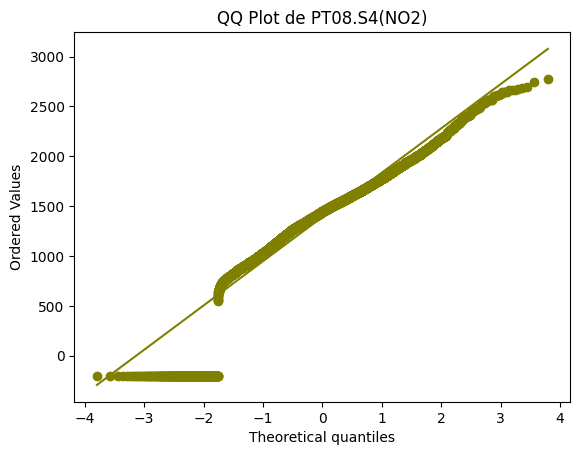

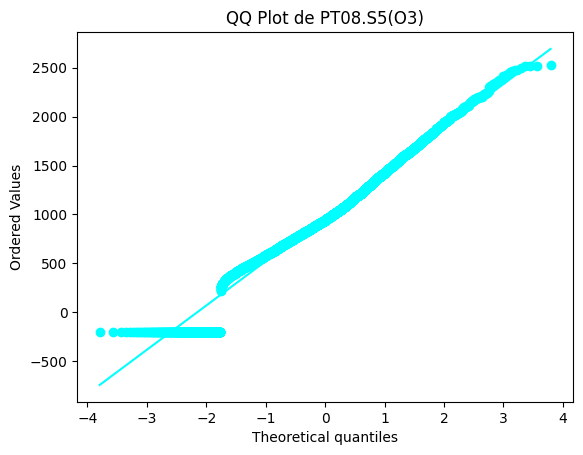

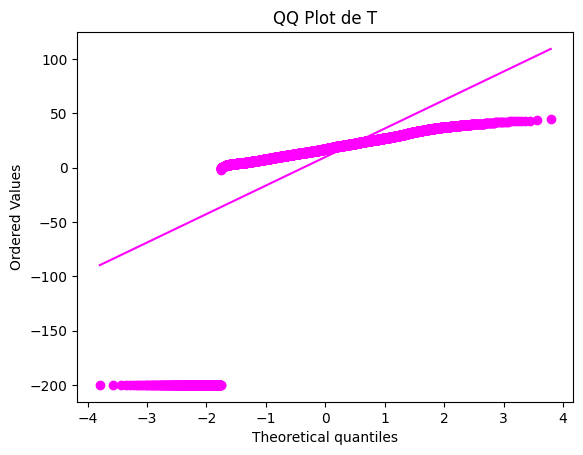

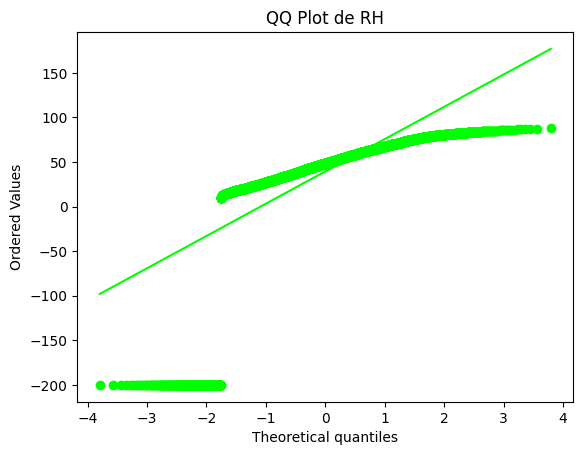

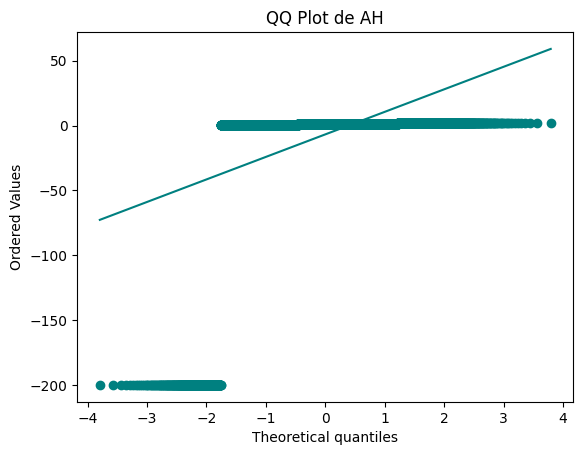

In [109]:
#QQplot
from scipy.stats import probplot
numeric_columns = df_or.select_dtypes(include=[np.number]).columns

# Define a list of colors
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'olive', 'cyan', 'magenta', 'lime', 'teal']

for i, col in enumerate(numeric_columns):
    plt.figure() # Create a new figure for each plot
    probplot(df_or[col], dist='norm', plot=plt)
    plt.title(f'QQ Plot de {col}')
    # Change the color of the plot elements
    ax = plt.gca()
    lines = ax.get_lines()
    for j, line in enumerate(lines):
        line.set_color(colors[i % len(colors)]) # Use modulo to cycle through colors
    plt.show() # Show each plot individually

Las graficas muestran el sesgo en cada una de las columnas, mientras que en algunas la parte central de la curva real se acerca a la normalizacion, los extremos tienden a alejarse o separarse complletamente hasta llegar a un extremo (Alto o bajo) en la grafica

###Limpieza de los datos

In [124]:
#Copiar el df

#valores nulos
print("\nValores nulos")
print(df_or.isnull().sum())

#Fueron eliminados en pasos previos
#df_or=df_or.dropna()

#valores duplicados
print("\nValores duplicados")
print(df_or.duplicated().sum())

print("\nValores duplicados")
print(df_or[df_or.duplicated()])

#imputacion de la mediana
print("\nImputacion de la mediana")
#-200 es el valor del outlier para co(gt)
num_columns=df_or.select_dtypes(include=[np.number]).columns
for col in num_columns:
    df_or[col].replace(-200, np.nan, inplace=True)
    median=df_or[col].median()
    df_or[col].fillna(median, inplace=True)


Valores nulos
Date             0
Time             0
CO(GT)           0
PT08.S1(CO)      0
NMHC(GT)         0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
DayOfTheWeek     0
dtype: int64

Valores duplicados
0

Valores duplicados
Empty DataFrame
Columns: [Date, Time, CO(GT), PT08.S1(CO), NMHC(GT), C6H6(GT), PT08.S2(NMHC), NOx(GT), PT08.S3(NOx), NO2(GT), PT08.S4(NO2), PT08.S5(O3), T, RH, AH, DayOfTheWeek]
Index: []

Imputacion de la mediana


/tmp/ipython-input-1911306492.py:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_or[col].replace(-200, np.nan, inplace=True)
/tmp/ipython-input-1911306492.py:24: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try us

###EDA despues de la limpieza de datos


Descripcion de los datos originales
            CO(GT)  PT08.S1(CO)     NMHC(GT)     C6H6(GT)  PT08.S2(NMHC)  \
count  9357.000000  9357.000000  9357.000000  9357.000000    9357.000000   
mean      2.089302  1098.392433   156.721599    10.009447     937.973923   
std       1.323024   212.911465    67.058156     7.311771     261.625561   
min       0.100000   647.000000     7.000000     0.100000     383.000000   
25%       1.200000   941.000000   150.000000     4.600000     743.000000   
50%       1.800000  1063.000000   150.000000     8.200000     909.000000   
75%       2.600000  1221.000000   150.000000    13.600000    1105.000000   
max      11.900000  2040.000000  1189.000000    63.700000    2214.000000   

           NOx(GT)  PT08.S3(NOx)      NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)  \
count  9357.000000   9357.000000  9357.000000   9357.000000  9357.000000   
mean    235.178903    834.339959   112.373303   1456.528054  1020.562894   
std     195.091025    251.808888    43.948519    3

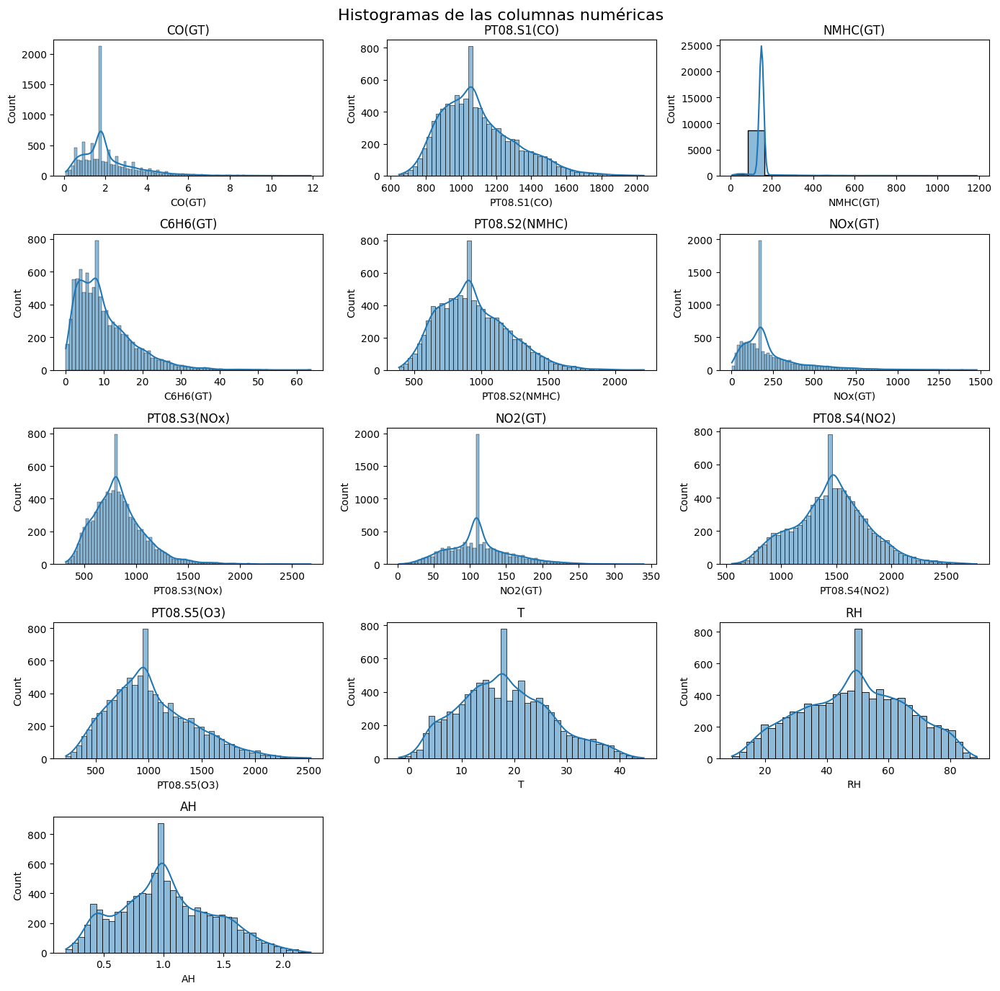


DataFrame con columna DayOfTheWeek
         Date      Time  CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  \
0  10/03/2004  18.00.00     2.6       1360.0     150.0      11.9   
1  10/03/2004  19.00.00     2.0       1292.0     112.0       9.4   
2  10/03/2004  20.00.00     2.2       1402.0      88.0       9.0   
3  10/03/2004  21.00.00     2.2       1376.0      80.0       9.2   
4  10/03/2004  22.00.00     1.6       1272.0      51.0       6.5   

   PT08.S2(NMHC)  NOx(GT)  PT08.S3(NOx)  NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)  \
0         1046.0    166.0        1056.0    113.0        1692.0       1268.0   
1          955.0    103.0        1174.0     92.0        1559.0        972.0   
2          939.0    131.0        1140.0    114.0        1555.0       1074.0   
3          948.0    172.0        1092.0    122.0        1584.0       1203.0   
4          836.0    131.0        1205.0    116.0        1490.0       1110.0   

      T    RH      AH DayOfTheWeek  
0  13.6  48.9  0.7578    Wednesday  
1  13.

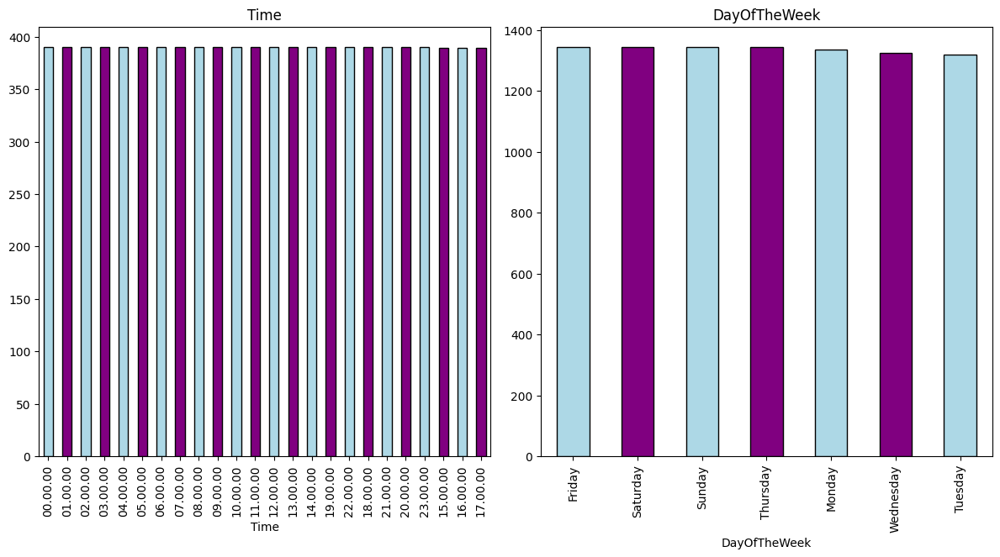

In [128]:
#Descripción de los datos (medias, medianas, desviaciones estándar, etc.).
print("\nDescripcion de los datos originales")
print(df_or.describe())

#Histogramas para las columnas numéricas.
plt.figure(figsize=(14, 14))
plt.suptitle('Histogramas de las columnas numéricas', fontsize=16)
columnas_numericas = df_or.select_dtypes(include=[np.number]).columns
for i, col in enumerate(columnas_numericas):
    plt.subplot(5, 3, i + 1)
    sns.histplot(df_or[col], kde=True)
    plt.title(col)
plt.tight_layout()
plt.show()

#Agregar columna del dia de la semana
df_or['DayOfTheWeek'] = pd.to_datetime(df_or['Date'], format='%d/%m/%Y', errors='coerce').dt.day_name()
print("\nDataFrame con columna DayOfTheWeek")
df_or['DayOfTheWeek']=df_or['DayOfTheWeek'].astype('category')

print(df_or.head())

#Graficas de variables categoricas reemplazando Date con DayOfTheWeek
print("\nGráficas de barras para las columnas categóricas")
columnas_categoricas = df_or.select_dtypes(include=['category']).columns
columnas_categoricas = [col for col in columnas_categoricas if col != 'Date']
plt.figure(figsize=(12, 12))
for i, col in enumerate(columnas_categoricas):
    plt.subplot(2, len(columnas_categoricas), i + 1)
    df_or[col].value_counts().plot(kind='bar', color=['lightblue','purple'], edgecolor='black')
    plt.title(col)
plt.tight_layout()
plt.show()



###

###

In [34]:
#test anderson darlin
from scipy.stats import anderson
numeric_columns = df_or.select_dtypes(include=[np.number]).columns
for col in numeric_columns:
    result = anderson(df_or[col])
    print(df_or[col].name, result.statistic, "\n")


CO(GT) 2501.1533398559914 

PT08.S1(CO) 355.41246072262584 

NMHC(GT) 2820.949168259176 

C6H6(GT) 2272.5848420067487 

PT08.S2(NMHC) 119.20818669713844 

NOx(GT) 188.7942852278611 

PT08.S3(NOx) 159.03112186396538 

NO2(GT) 894.6616349197138 

PT08.S4(NO2) 183.34158388660398 

PT08.S5(O3) 45.682343326749105 

T 2041.4585777183256 

RH 1329.0445989555683 

AH 3357.6806201573145 



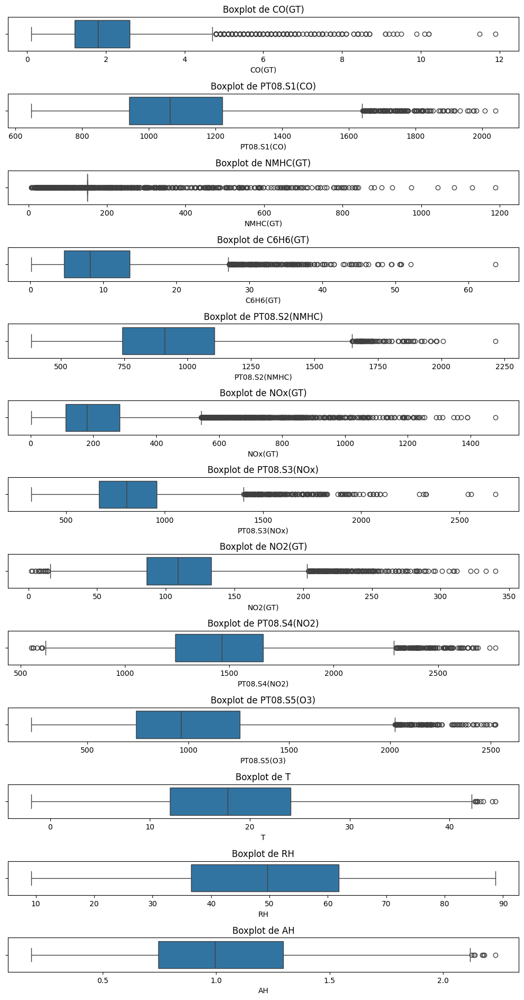

In [129]:
numeric_columns = df_or.select_dtypes(include=[np.number]).columns

# Configurar el tamaño de la figura
plt.figure(figsize=(10, 20))

# Crear boxplots para each columna numérica
for i, col in enumerate(numeric_columns, 1):
    plt.subplot(14, 1, i)
    sns.boxplot(x=df_or[col]) # Changed df to df_or
    plt.title(f'Boxplot de {col}')
plt.tight_layout()
plt.show()

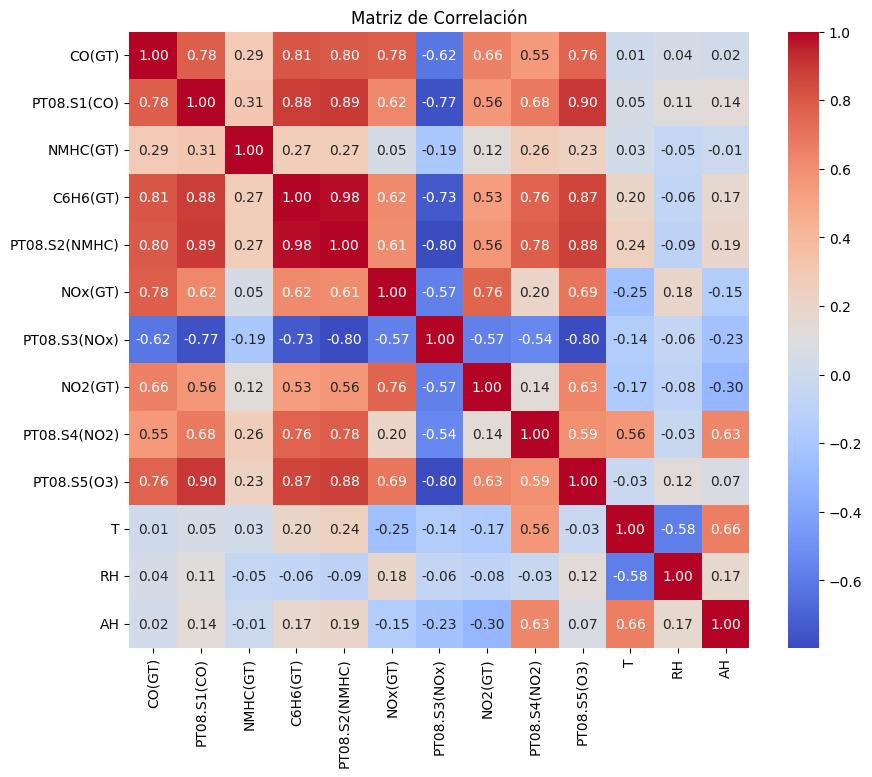

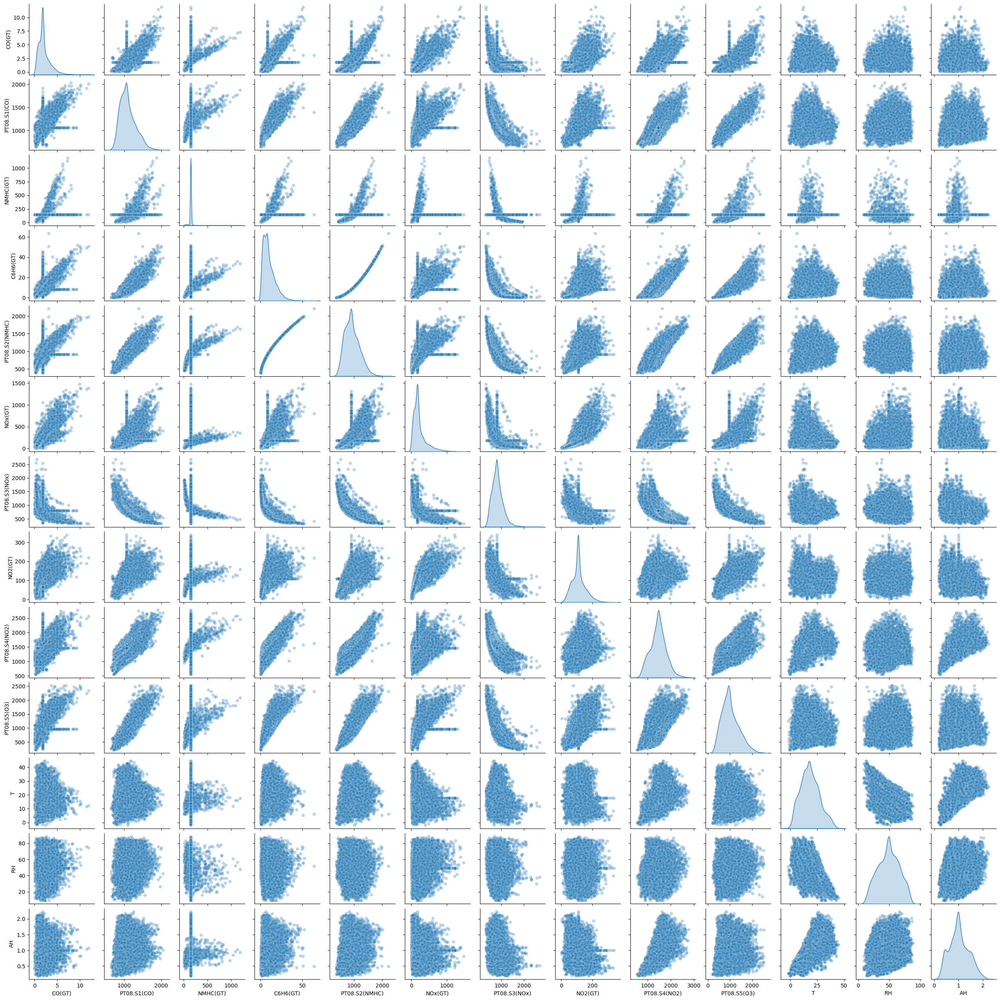

In [130]:
#matriz de correlacion
numeric_df = df_or.select_dtypes(include=[np.number]) # Select only numeric columns
corr_matrix = numeric_df.corr() # Calculate correlation matrix on numeric columns

#mapa de calor
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f") # Add heatmap
plt.title('Matriz de Correlación')
plt.show()

#pairplot
sns.pairplot(numeric_df, plot_kws={'alpha': 0.3}, diag_kind='kde', height=2) # Use numeric_df directly
plt.show()

In [131]:
#normalidad para variables numericas
#Shapiro-wilk


print("\nPruebas de normalidad (Shapiro-Wilk)")

from scipy.stats import shapiro
numeric_columns = df_or.select_dtypes(include=[np.number]).columns
shapiro_results = []
for col in numeric_columns:
    statistic, pvalue = shapiro(df_or[col])
    shapiro_results.append({'Variable': col, 'Statistic': statistic, 'P-value': pvalue})
shapiro_df = pd.DataFrame(shapiro_results)
display(shapiro_df)


Pruebas de normalidad (Shapiro-Wilk)


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 9357.
  res = hypotest_fun_out(*samples, **kwds)


,Variable,Statistic,P-value
0,CO(GT),0.874316,1.657915e-65
1,PT08.S1(CO),0.959461,5.149002e-45
2,NMHC(GT),0.251617,7.366552e-106
3,C6H6(GT),0.892199,1.702423e-62
4,PT08.S2(NMHC),0.976923,2.766894e-36
5,NOx(GT),0.800087,4.677563e-75
6,PT08.S3(NOx),0.943262,1.087046e-50
7,NO2(GT),0.960666,1.599866e-44
8,PT08.S4(NO2),0.992631,1.353907e-21
9,PT08.S5(O3),0.970043,3.317079e-40


In [132]:
#test anderson darlin
from scipy.stats import anderson
numeric_columns = df_or.select_dtypes(include=[np.number]).columns
anderson_results = []
for col in numeric_columns:
    result = anderson(df_or[col])
    anderson_results.append({'Variable': col, 'Statistic': result.statistic, 'Critical Values': result.critical_values})
anderson_df = pd.DataFrame(anderson_results)
display(anderson_df)

,Variable,Statistic,Critical Values
0,CO(GT),315.911643,"[0.576, 0.656, 0.787, 0.918, 1.092]"
1,PT08.S1(CO),103.126006,"[0.576, 0.656, 0.787, 0.918, 1.092]"
2,NMHC(GT),2808.068990,"[0.576, 0.656, 0.787, 0.918, 1.092]"
3,C6H6(GT),247.101944,"[0.576, 0.656, 0.787, 0.918, 1.092]"
4,PT08.S2(NMHC),49.714088,"[0.576, 0.656, 0.787, 0.918, 1.092]"
5,NOx(GT),559.571090,"[0.576, 0.656, 0.787, 0.918, 1.092]"
6,PT08.S3(NOx),87.973100,"[0.576, 0.656, 0.787, 0.918, 1.092]"
7,NO2(GT),122.299695,"[0.576, 0.656, 0.787, 0.918, 1.092]"
8,PT08.S4(NO2),14.297052,"[0.576, 0.656, 0.787, 0.918, 1.092]"
9,PT08.S5(O3),73.276449,"[0.576, 0.656, 0.787, 0.918, 1.092]"


In [133]:
#Prueba Kolmogorov-Smirnov
from scipy.stats import kstest
kresult=[]
numeric_columns = df_or.select_dtypes(include=[np.number]).columns
for col in numeric_columns:
    stat = kstest(df_or[col], 'norm')
    kresult.append({'Variable': col, 'Statistic': stat.statistic, 'P-value': stat.pvalue, 'Sloc':stat.statistic_location, 'Sign': stat.statistic_sign})
kresult_df = pd.DataFrame(kresult)
display(kresult_df)

,Variable,Statistic,P-value,Sloc,Sign
0,CO(GT),0.676151,0.0,0.9000,-1
1,PT08.S1(CO),1.000000,0.0,647.0000,-1
2,NMHC(GT),1.000000,0.0,7.0000,-1
3,C6H6(GT),0.917081,0.0,2.0000,-1
4,PT08.S2(NMHC),1.000000,0.0,383.0000,-1
5,NOx(GT),0.999861,0.0,4.0000,-1
6,PT08.S3(NOx),1.000000,0.0,322.0000,-1
7,NO2(GT),0.999786,0.0,5.0000,-1
8,PT08.S4(NO2),1.000000,0.0,551.0000,-1
9,PT08.S5(O3),1.000000,0.0,221.0000,-1


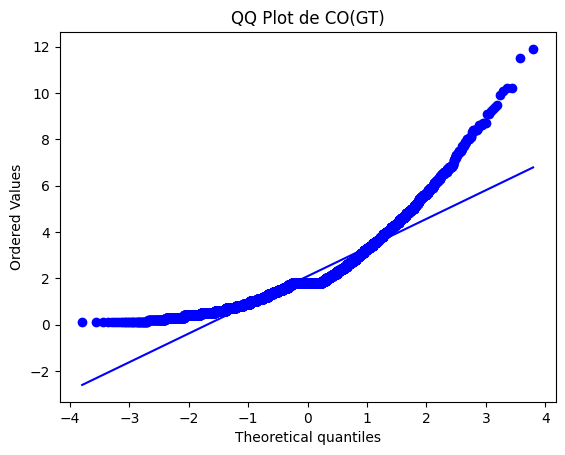

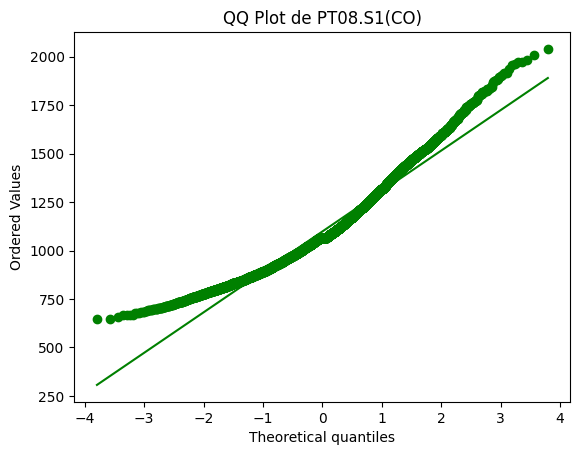

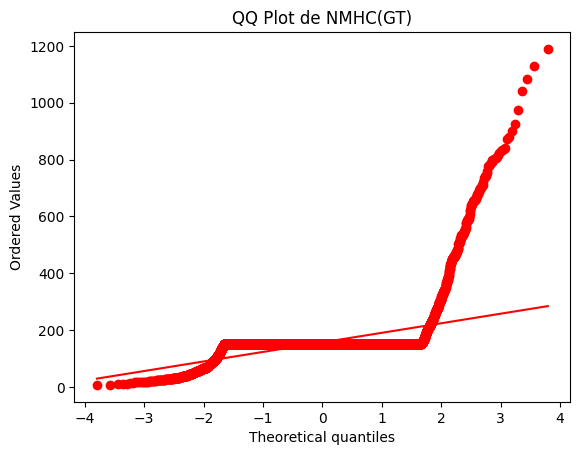

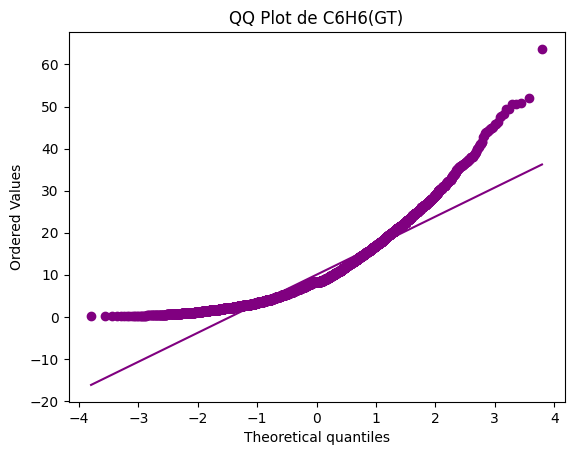

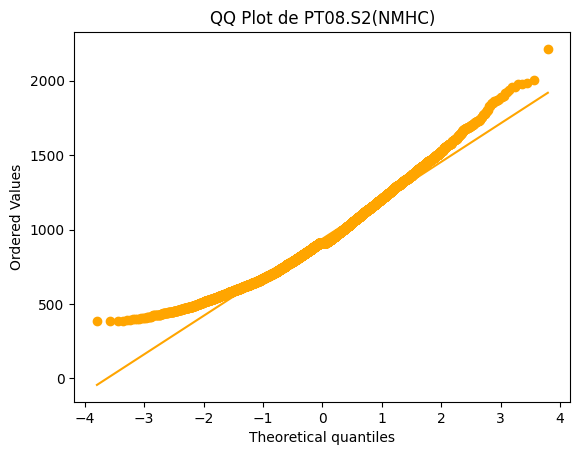

...

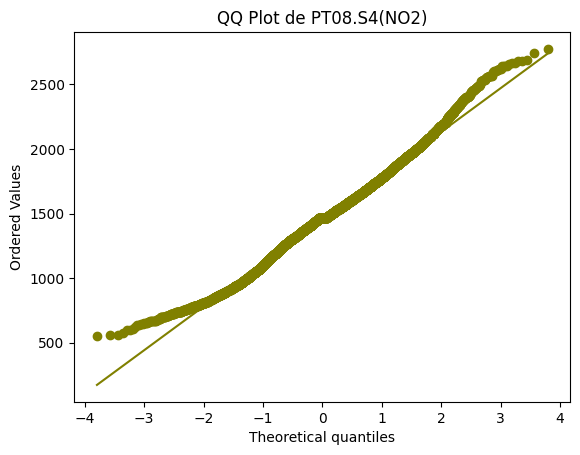

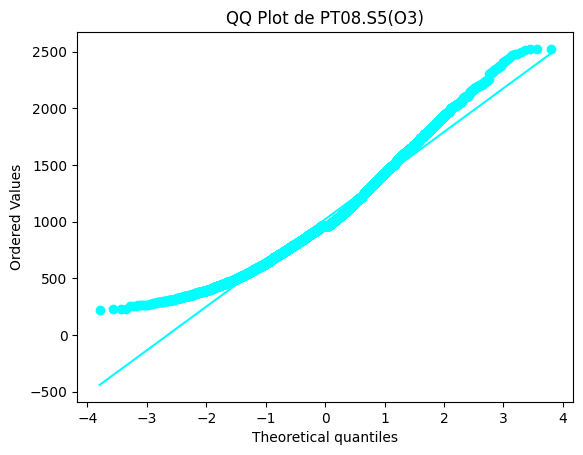

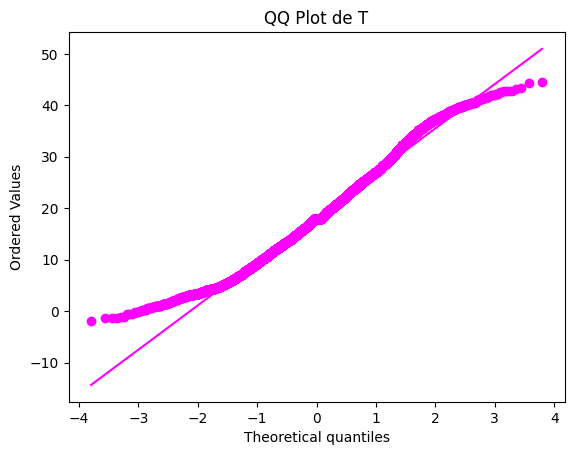

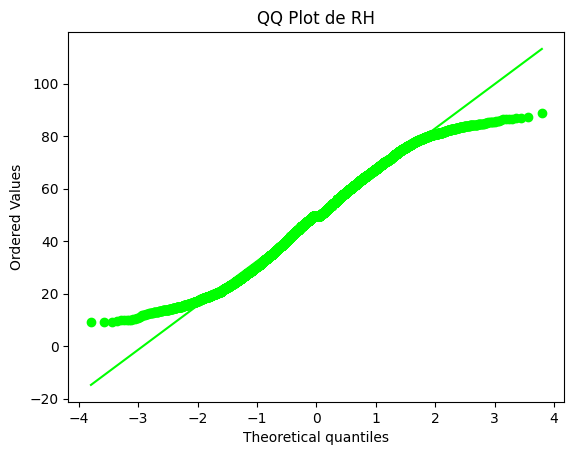

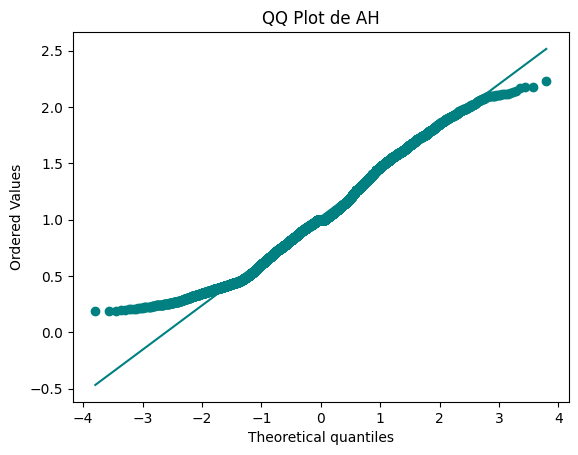

In [135]:
#QQplot
from scipy.stats import probplot
numeric_columns = df_or.select_dtypes(include=[np.number]).columns

# Define a list of colors
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'olive', 'cyan', 'magenta', 'lime', 'teal']

for i, col in enumerate(numeric_columns):
    plt.figure() # Create a new figure for each plot
    probplot(df_or[col], dist='norm', plot=plt)
    plt.title(f'QQ Plot de {col}')
    # Change the color of the plot elements
    ax = plt.gca()
    lines = ax.get_lines()
    for j, line in enumerate(lines):
        line.set_color(colors[i % len(colors)]) # Use modulo to cycle through colors
    plt.show() # Show each plot individually